In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
import os
os.chdir('/content/drive/My Drive/DL_projects/flikr8k_captioning')

In [2]:
# if the notebook is runned on google colab
from os import path
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())

accelerator = 'cu80' if path.exists('/opt/bin/nvidia-smi') else 'cpu'

!pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.1-{platform}-linux_x86_64.whl torchvision

tcmalloc: large alloc 1073750016 bytes == 0x56e50000 @  0x7f95a0f832a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641


In [0]:
# colab needs version 4.1.1
!pip install Pillow==4.1.1
!pip install image

    100% |████████████████████████████████| 5.7MB 6.5MB/s 
  Found existing installation: Pillow 5.3.0
    Uninstalling Pillow-5.3.0:
      Successfully uninstalled Pillow-5.3.0


In [41]:
from data_utils import *
from solver import *
from model import *

%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [0]:
USE_GPU = True
dtype = torch.float32
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [0]:
loader = prepare_loader('../Data/flikr8k/', batch_size=128, data_part='test')
data = loader.dataset
vocab_size = len(data.idx_to_word)

In [0]:
model = CaptionModel_B(2048, 50, 160, vocab_size, num_layers=1)
model.load_state_dict(torch.load('im_caption_35.727_0.316_epoch_20.pth.tar'))
solver = NetSolver(data, model)

In [0]:
def preprocess(im):
    rgb_mean = [0.485, 0.456, 0.406]
    rgb_std = [0.229, 0.224, 0.225]
    
    transform = T.Compose([
                    T.Resize((224, 224)),
                    T.ToTensor(),
                    T.Normalize(rgb_mean, rgb_std),
                ])
    return transform(im).unsqueeze(0)


def get_captions(path):
    raw_f = open(path + 'Flickr8k.token.txt', 'r').read().strip().split('\n')
    raw_captions = {}
    for line in raw_f:
        line = line.split('\t')
        im_id, cap = line[0][:len(line[0])-2], line[1]
        if im_id not in raw_captions:
            raw_captions[im_id] = ['<start> ' + cap + ' <end>']
        else:
            raw_captions[im_id].append('<start> ' + cap + ' <end>')
    return raw_captions


def sample_and_plot(im_id):
    for s in raw_captions[im_id]:
        print(s)
    print()

    im = Image.open('../Data/flikr8k/Flicker8k_Dataset/'+im_id)
    im_t = preprocess(im).to(device)
    feature = extract_features(cnn, im_t).squeeze().unsqueeze(0)

    s1 = solver.sample(feature, search_mode='greedy')
    s1 = decode_captions(s1, data.idx_to_word)
    s2 = solver.sample(feature, search_mode='beam', b_size=5)
    s2 = decode_captions(s2, data.idx_to_word)
    s3 = solver.sample(feature, search_mode='beam', b_size=10)
    s3 = decode_captions(s3, data.idx_to_word)
    s4 = solver.sample(feature, search_mode='beam', b_size=15)
    s4 = decode_captions(s4, data.idx_to_word)

    print('Greedy:', s1[0])
    print('B=5:', s2[0])
    print('B=10:', s3[0])
    print('B=15:', s4[0])
    plt.imshow(np.array(im))
    plt.axis('off')

In [0]:
raw_captions = get_captions('../Data/flikr8k/')

In [11]:
list(raw_captions.keys())[:10]

['1000268201_693b08cb0e.jpg',
 '1001773457_577c3a7d70.jpg',
 '1002674143_1b742ab4b8.jpg',
 '1003163366_44323f5815.jpg',
 '1007129816_e794419615.jpg',
 '1007320043_627395c3d8.jpg',
 '1009434119_febe49276a.jpg',
 '1012212859_01547e3f17.jpg',
 '1015118661_980735411b.jpg',
 '1015584366_dfcec3c85a.jpg']

<start> a beagle and a golden retriever wrestling in the grass <end>
<start> Two dogs are wrestling in the grass . <end>
<start> Two puppies are playing in the green grass . <end>
<start> two puppies playing around in the grass <end>
<start> Two puppies play in the grass <end>

Greedy: <start> Two dogs play in the grass . <end>
B=5: <start> Two dogs play in the grass . <end>
B=10: <start> Two dogs play in the grass . <end>
B=15: <start> Two dogs play in the grass . <end>


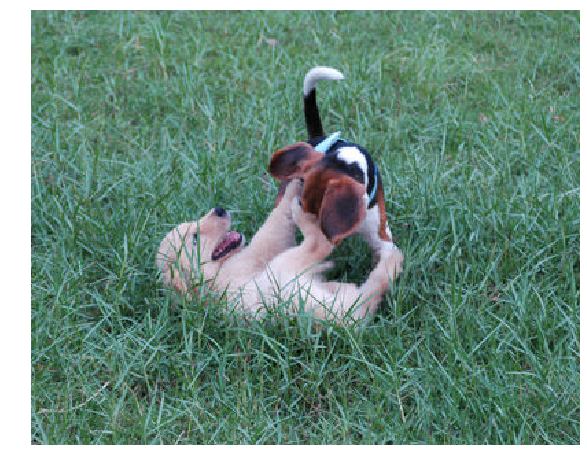

In [57]:
im_id = '23445819_3a458716c1.jpg'
sample_and_plot(im_id)

<start> a kayaker kayaks through the water . <end>
<start> A person kayaking in the ocean . <end>
<start> A person kayaks in the middle of the ocean on a grey day . <end>
<start> A person rows a boat over a large body of water . <end>
<start> person in a boat with a paddle in hand <end>

Greedy: <start> A person is kayaking in the water . <end>
B=5: <start> A person is kayaking in the boat . <end>
B=10: <start> A person is sitting on a boat . <end>
B=15: <start> A person in a boat . <end>


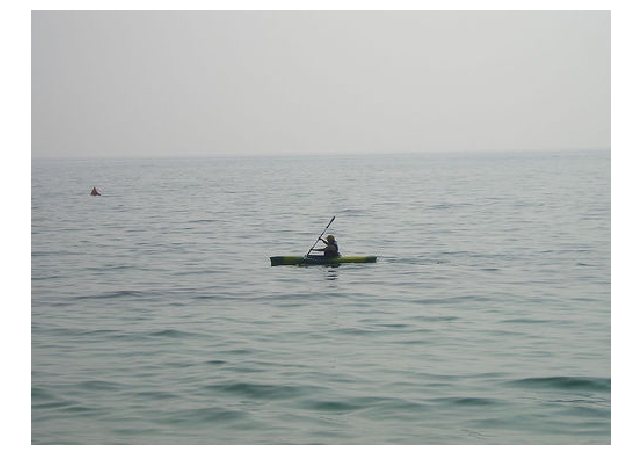

In [56]:
im_id = '19212715_20476497a3.jpg'
sample_and_plot(im_id)

<start> Silhouette of two people sitting on a dock at sunset <end>
<start> Two people are sitting on a wooden dock on a lake at sunset . <end>
<start> Two people sit on a dock with a sunset in the background . <end>
<start> Two people sit on the pier together and look out at the ocean . <end>
<start> Two people sitting on a dock under a lamp post with clouds in the sky beyond them . <end>

Greedy: <start> Two people sit on a dock and looking at the water . <end>
B=5: <start> Two people sit on a dock by the water . <end>
B=10: <start> Two people sit on a dock by a bridge . <end>
B=15: <start> Two people sitting on the edge of the water . <end>


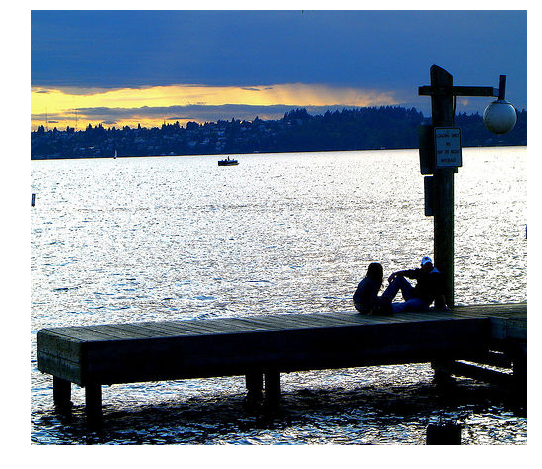

In [62]:
im_id = '42637986_135a9786a6.jpg'
sample_and_plot(im_id)

<start> A man at the top of a mountain with a beautiful view in the background <end>
<start> A man is sitting on a snowbank . <end>
<start> A man on a snowy peak . <end>
<start> A person in red snow gear is kneeling on a snowy ridge under a blue sky . <end>
<start> mountain climber in a red suit poses on snowy peak with mountains in the background <end>

Greedy: <start> A man in a red jacket is skiing down a snowy mountain . <end>
B=5: <start> A man in a red jacket . <end>
B=10: <start> A man in the mountain . <end>
B=15: <start> A man in the top of snow . <end>


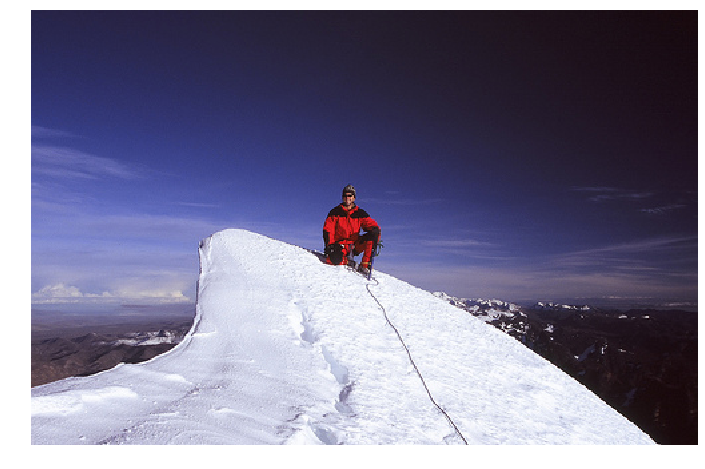

In [67]:
im_id = '55473406_1d2271c1f2.jpg'
sample_and_plot(im_id)

<start> A backpacker in the mountains using his hiking stick to point at a glacier . <end>
<start> A backpacker points to the snow-capped mountains as he stands on a rocky plain . <end>
<start> A hiker is pointing towards the mountains . <end>
<start> A hiker poses for a picture in front of stunning mountains and clouds . <end>
<start> A man with a green pack using his pole to point to snowcapped mountains . <end>

Greedy: <start> A man with a backpack is standing on a mountain . <end>
B=5: <start> A man is standing on the mountain . <end>
B=10: <start> A man standing on top of a mountain . <end>
B=15: <start> A man with a backpack stands on a mountain . <end>


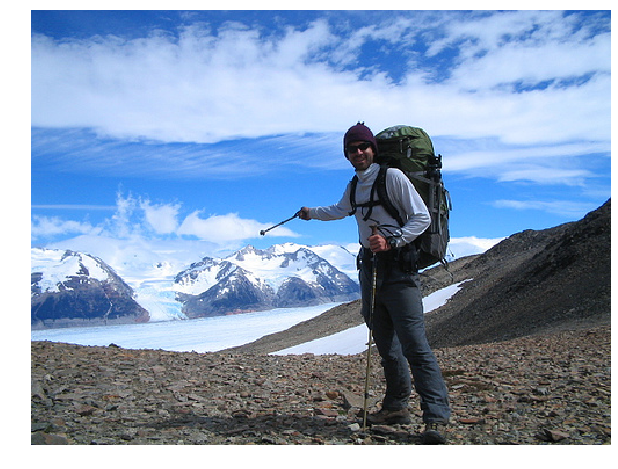

In [68]:
im_id = '54501196_a9ac9d66f2.jpg'
sample_and_plot(im_id)

<start> A man is riding on a red motorcycle . <end>
<start> A motorcycle driver dressed in orange gear swerves to the right . <end>
<start> A motorcyclist on a red speed bike leans into a sharp turn . <end>
<start> Motorcyclist crouches low as he rounds a turn . <end>
<start> This person is on a red motorcycle . <end>

Greedy: <start> A man in a red helmet is riding a red motorcycle . <end>
B=5: <start> A man in a red helmet is riding a motorcycle . <end>
B=10: <start> A man in a red helmet is riding a red motorcycle . <end>
B=15: <start> A man on a motorcycle is wearing a helmet . <end>


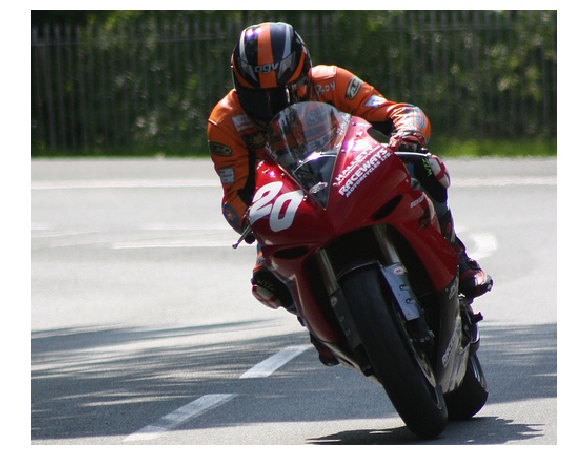

In [73]:
im_id = '166321294_4a5e68535f.jpg'
sample_and_plot(im_id)

<start> A woman in a blue shirt guides her dog over an obstacle . <end>
<start> a woman is running beside a dog that is jumping over a red and white obedience training fence . <end>
<start> A woman next to a dog which is running an obstacle course . <end>
<start> A woman walking with a Sheltie through a competition obstacle course . <end>
<start> The dog is jumping over the hurdles beside a woman . <end>

Greedy: <start> A dog jumps over a hurdle . <end>
B=5: <start> A dog jumps over a hurdle . <end>
B=10: <start> A dog jumps over a hurdle . <end>
B=15: <start> A dog jumps over a hurdle . <end>


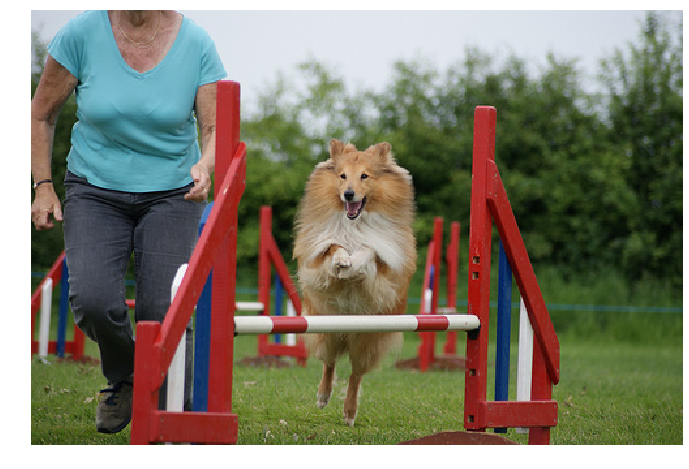

In [159]:
im_id = '2542662402_d781dd7f7c.jpg'
sample_and_plot(im_id)

<start> A football player runs with a ball , chased by the opposing team . <end>
<start> A football player runs with the ball as others run towards him . <end>
<start> A player has the football as a crowd in red and white watches <end>
<start> The American football team in white are attempting to stop the player in red who is running with the ball . <end>
<start> Two teams playing a football game in a packed stadium <end>

Greedy: <start> A football player in a red jersey is running with a football player in the background . <end>
B=5: <start> A football player is being tackled . <end>
B=10: <start> A football player in a blue team . <end>
B=15: <start> A football player in a red jersey is running . <end>


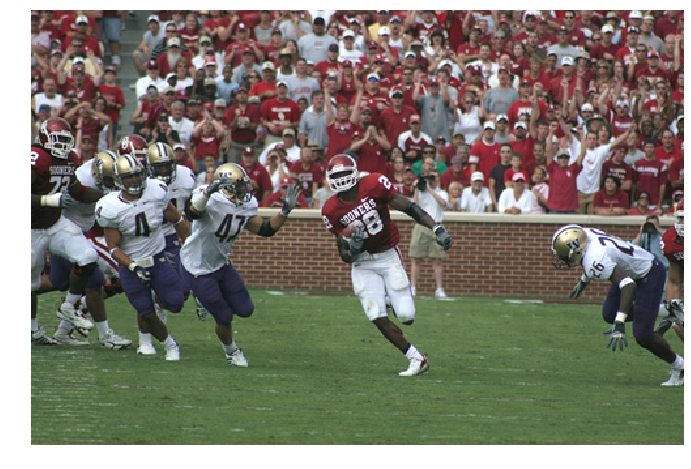

In [75]:
im_id = '241346923_18bd84bea4.jpg'
sample_and_plot(im_id)

<start> A group of soccer players after a ball . <end>
<start> A soccer game between the red team and the blue team . <end>
<start> A soccer game is in progress . <end>
<start> Soccer game with teams in red and blue . <end>
<start> two teams of soccer players playing a game on a field <end>

Greedy: <start> A soccer player in a red uniform is running with a soccer ball in front of a crowd . <end>
B=5: <start> A soccer player in a red uniform is playing soccer . <end>
B=10: <start> A soccer player is playing soccer . <end>
B=15: <start> A group of soccer ball . <end>


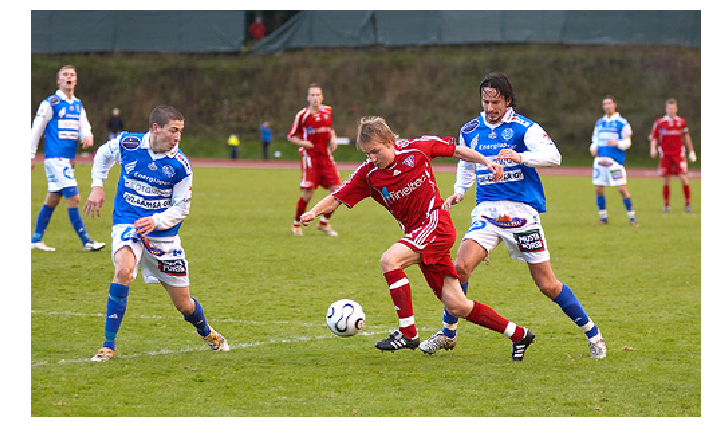

In [76]:
im_id = '269986132_91b71e8aaa.jpg'
sample_and_plot(im_id)

<start> A snowboarder in bright green performing a jump at a competition . <end>
<start> A snowboarder in midair , after jumping a ramp . <end>
<start> A snowboarder jumps high in the air over a snowy hill . <end>
<start> A snowboarder launches off a ramp . <end>
<start> Snowboarder sails in the air . <end>

Greedy: <start> A snowboarder is jumping off a hill . <end>
B=5: <start> A snowboarder jumps off a trick . <end>
B=10: <start> A snowboarder is jumping in the hill . <end>
B=15: <start> A snowboarder is jumping off of snow . <end>


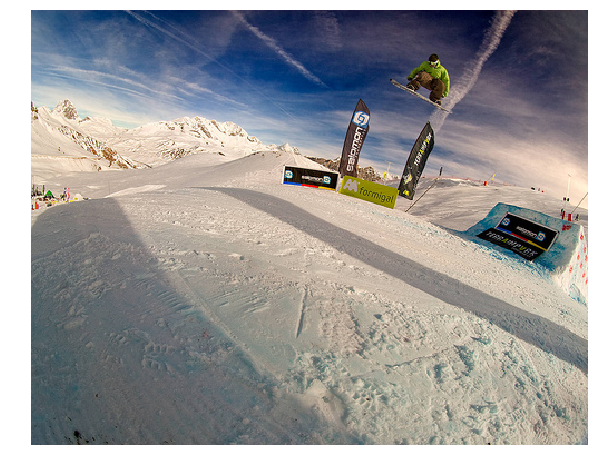

In [160]:
im_id = '3123351642_3794f2f601.jpg'
sample_and_plot(im_id)

<start> A boy in a blue shirt jumps down stairs on a skateboard . <end>
<start> A man flies through the air on his skateboard above a white staircase . <end>
<start> A skateboarder jumps his board down a flight of stairs . <end>
<start> A skateboarder sails over white steps . <end>
<start> Skateboarder jumping down stairs of building . <end>

Greedy: <start> A boy is jumping off a ramp . <end>
B=5: <start> A man is doing a skateboard down a railing . <end>
B=10: <start> A man is doing a skateboard down a ramp . <end>
B=15: <start> A man is doing a skateboard in front of stairs . <end>


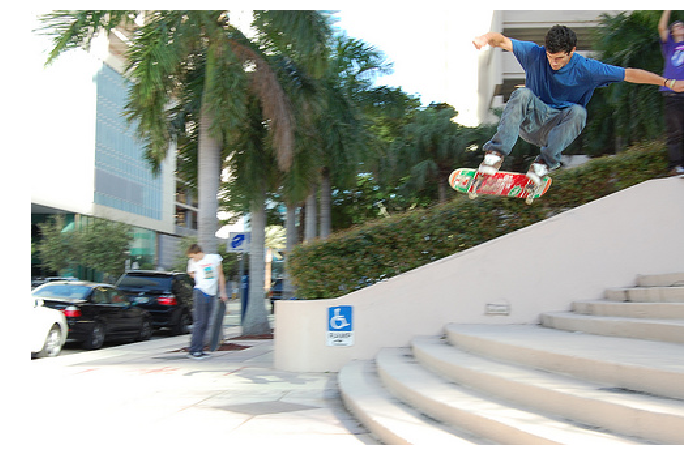

In [158]:
im_id = '2306674172_dc07c7f847.jpg'
sample_and_plot(im_id)

<start> A brown dog digging for a ball in the sand <end>
<start> A brown dog digs in the sand for an orange ball . <end>
<start> A brown dog is trying to retrive his orange ball that has fallen in a dirt hole . <end>
<start> A dog burrowing in the dirt trying to get an orange ball . <end>
<start> A dog digging for his ball in the sand . <end>

Greedy: <start> A brown dog is playing with a ball in the snow . <end>
B=5: <start> A brown dog is playing with a ball in its mouth . <end>
B=10: <start> A brown dog is playing with a ball in the sand . <end>
B=15: <start> A brown dog is playing with a ball in the sand . <end>


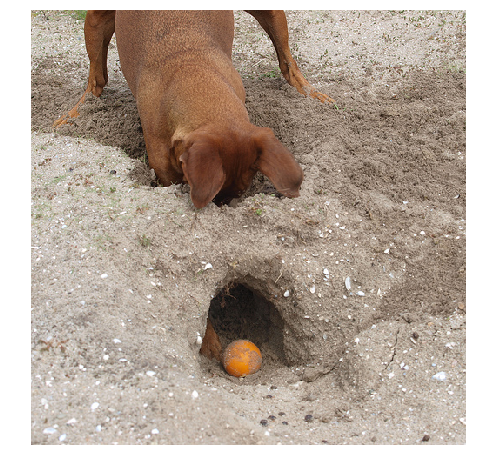

In [155]:
im_id = '2846843520_b0e6211478.jpg'
sample_and_plot(im_id)

<start> A helmeted man jumping off a rock on a mountain bike . <end>
<start> A man jumping on his bmx with another bmxer watching . <end>
<start> A mountain biker is jumping his bike over a rock as another cyclist stands on the trail watching . <end>
<start> A person taking a jump off a rock on a dirt bike . <end>
<start> The bike rider jumps off a rock . <end>

Greedy: <start> A man in a red helmet is riding a bike through the woods . <end>
B=5: <start> A person is riding a bike through the woods . <end>
B=10: <start> A person is riding a bike through the forest . <end>
B=15: <start> A person is riding a bike down a hill . <end>


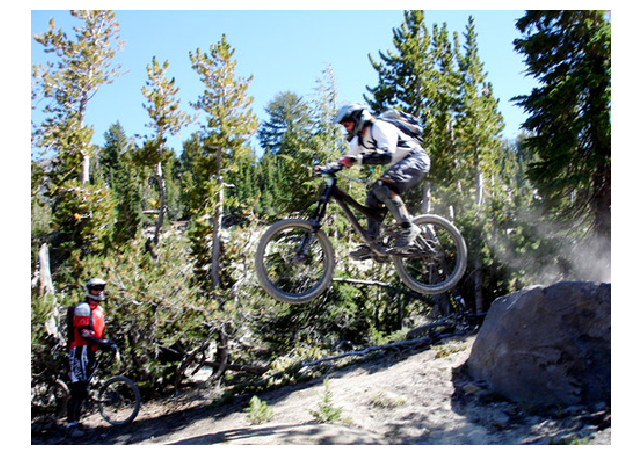

In [146]:
im_id = '136552115_6dc3e7231c.jpg'
sample_and_plot(im_id)

<start> A boy is making a huge splash in a paddling pool . <end>
<start> A little boy is going down a blue and red slip and slide . <end>
<start> A little boy landing with a splash on a very wet slip & slide . <end>
<start> A young boy sliding down a water slide toy . <end>
<start> Little boy getting soaked playing an outdoor water game . <end>

Greedy: <start> A boy is splashing in a pool . <end>
B=5: <start> A little boy in a swimming pool . <end>
B=10: <start> A boy is playing in the swimming pool . <end>
B=15: <start> A boy is playing in the pool . <end>


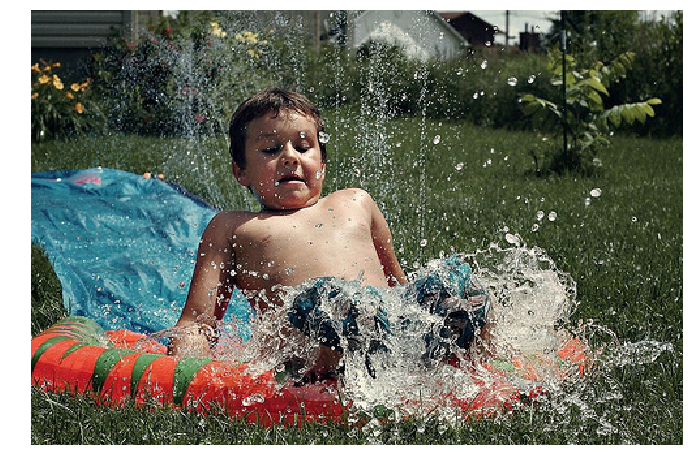

In [140]:
im_id = '3710176138_fbfe00bd35.jpg'
sample_and_plot(im_id)

<start> A girl walking with her grey umbrella . <end>
<start> A woman holding an umbrella is standing near a parking meter . <end>
<start> A woman is walking down the street holding an umbrella . <end>
<start> A woman with a blue umbrella stands next to a parking meter . <end>
<start> A woman in heels , black skirt and white shirt , holds her blue umbrella over her head while walking on a sidewalk near a parking meter . <end>

Greedy: <start> A woman in a white shirt is walking on a sidewalk near a city street . <end>
B=5: <start> A woman in a white dress is standing in a sidewalk . <end>
B=10: <start> A woman in a white dress is walking along a sidewalk . <end>
B=15: <start> A woman in a white dress is walking along the street . <end>


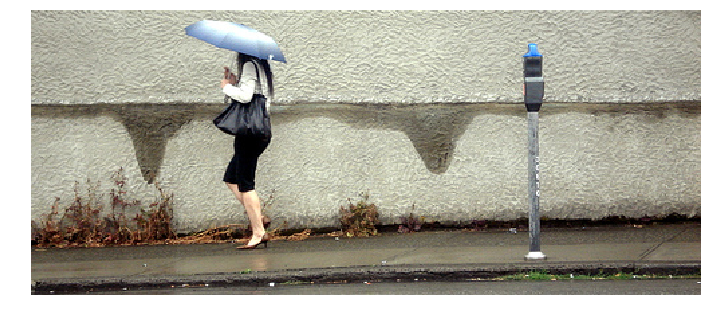

In [138]:
im_id = '842961005_692737888e.jpg'
sample_and_plot(im_id)

<start> A boy walks in a meadow near some trees . <end>
<start> A little boy in a blue shirt is running through a forested green area . <end>
<start> A little boy in shorts and t-shirt run in a field of grass towards some trees . <end>
<start> A youg boy in a blue shirt walks through a park . <end>
<start> Little boy running in a grassy field towards a tree . <end>

Greedy: <start> A boy in a blue shirt is running through a grassy field . <end>
B=5: <start> A little boy is running through a field . <end>
B=10: <start> A little boy is running through a field . <end>
B=15: <start> A little boy is running through a park . <end>


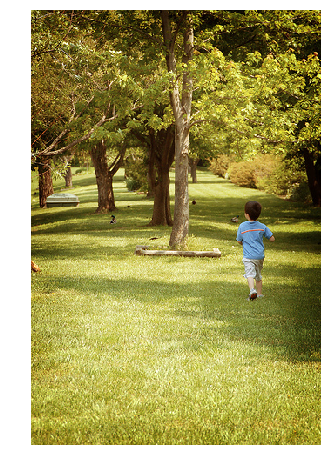

In [132]:
im_id = '762947607_2001ee4c72.jpg'
sample_and_plot(im_id)

<start> A climber scales a cliff as others watch . <end>
<start> A figure is climbing up a rock while people on the grond watch . <end>
<start> A person climbs a cliff face in the woods while others watch . <end>
<start> A woman is rock climbing <end>
<start> People are watching a man who is climbing on a rock face . <end>

Greedy: <start> A man is climbing a rock wall . <end>
B=5: <start> A man is climbing a rock wall . <end>
B=10: <start> A man is climbing a rock wall . <end>
B=15: <start> A man is climbing a rock wall . <end>


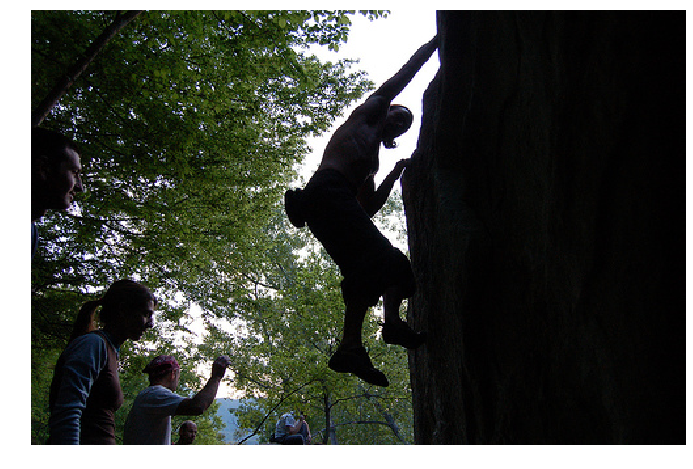

In [126]:
im_id = '482907079_22085ada04.jpg'
sample_and_plot(im_id)

<start> A group of friends ride the current in a raft . <end>
<start> A group of people river rafting . <end>
<start> A group of people wearing life jackets riding a raft through rough waters . <end>
<start> a large group of people in a red raft wearing red life jackets on the river <end>
<start> this group of people are practicing water safety by wearing preservers while in a raft on the river <end>

Greedy: <start> A group of people are riding a raft on a raft . <end>
B=5: <start> A group of people on a raft . <end>
B=10: <start> A group of people are riding on a raft . <end>
B=15: <start> A group of people are riding on a raft . <end>


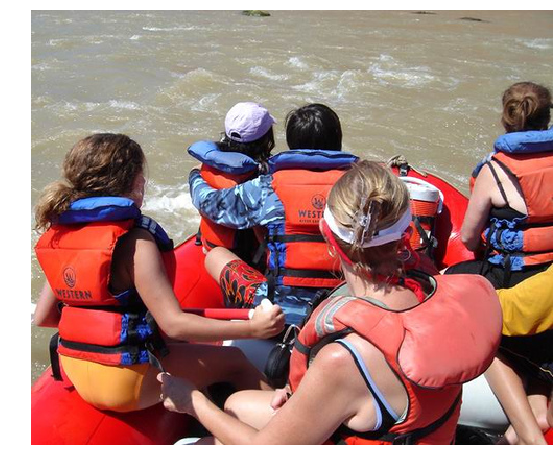

In [121]:
im_id = '2056377805_e9a9b3bcf0.jpg'
sample_and_plot(im_id)

<start> A black dog is running through the snow . <end>
<start> A black Labrador bounds across the snow . <end>
<start> A little black dog is running on the snow . <end>
<start> A small black dog runs through the white snow . <end>
<start> The black dog is running through the snow . <end>

Greedy: <start> A black dog is running through the snow . <end>
B=5: <start> A black dog is running through the snow . <end>
B=10: <start> A black dog is running through the snow . <end>
B=15: <start> A black dog runs through the snow . <end>


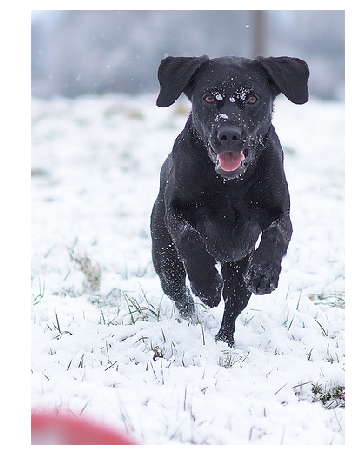

In [101]:
im_id = '3279025792_23bfd21bcc.jpg'
sample_and_plot(im_id)

<start> There are women in St Patrick 's Day costumes <end>
<start> Three women celebrate St Patrick 's day by dressing up in green and white on a busy street . <end>
<start> Three women dressed in green celebrating St Patricks Day . <end>
<start> Three women dressed up in green and shamrocks . <end>
<start> Three women wearing plenty of green and shamrocks . <end>

Greedy: <start> A group of people dressed in colorful costumes . <end>
B=5: <start> A group of people dressed in costumes . <end>
B=10: <start> A group of people dressed in colorful costumes . <end>
B=15: <start> A group of people are wearing costumes . <end>


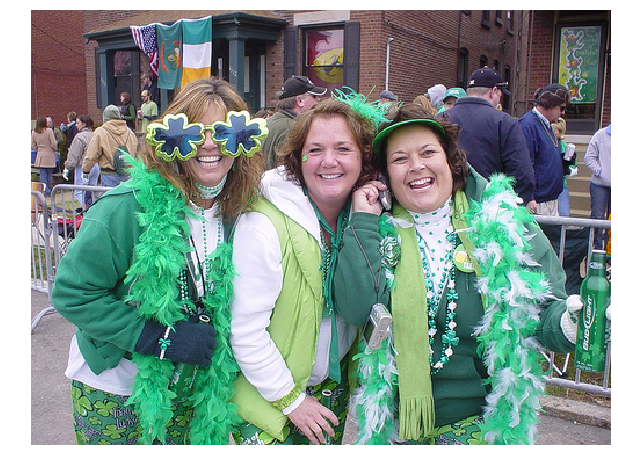

In [94]:
im_id = '424779662_568f9606d0.jpg'
sample_and_plot(im_id)

<start> A lady wearing a red dress is playing a bagpipe . <end>
<start> A woman in a red dress playing an instrument . <end>
<start> A woman in a red medieval type dress playing a bagpipe or some similar instrument . <end>
<start> A woman in costume is playing a bagpipe . <end>
<start> A woman wearing a red costume plays an instrument against a brick wall . <end>

Greedy: <start> A woman in a red dress is standing next to a building . <end>
B=5: <start> A woman in a red dress is standing next to a building . <end>
B=10: <start> A woman in a red dress is standing next to a window . <end>
B=15: <start> A woman in a red dress is standing next to a building . <end>


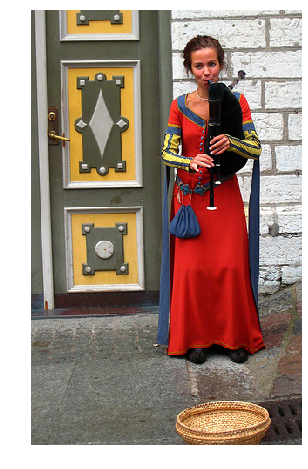

In [122]:
im_id = '2836325261_a3bf5c59be.jpg'
sample_and_plot(im_id)

<start> A girl is stretched out in shallow water <end>
<start> A girl wearing a red and multi-colored bikini is laying on her back in shallow water . <end>
<start> A little girl in a red swimsuit is laying on her back in shallow water . <end>
<start> A young girl is lying in the sand , while ocean water is surrounding her . <end>
<start> Girl wearing a bikini lying on her back in a shallow pool of clear blue water . <end>

Greedy: <start> A girl in a pink bathing suit is jumping in the air . <end>
B=5: <start> A girl in a pink bathing suit is in the water . <end>
B=10: <start> A girl in a pink bathing suit is on the pool . <end>
B=15: <start> A girl in a pink bathing suit jumps into the water . <end>


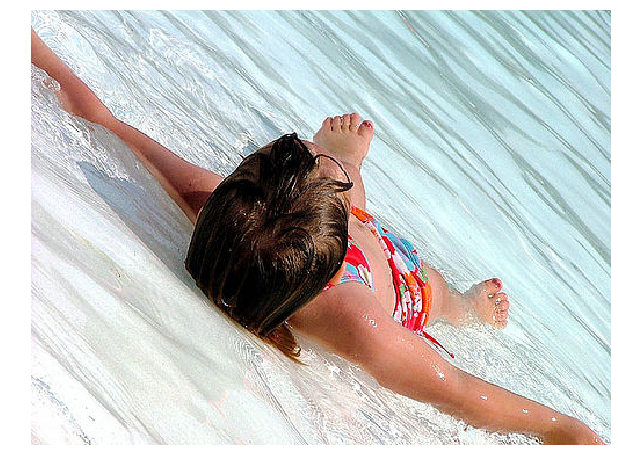

In [51]:
im_id = '667626_18933d713e.jpg'
sample_and_plot(im_id)

<start> Children sit and watch the fish moving in the pond <end>
<start> people stare at the orange fish . <end>
<start> Several people are standing near a fish pond . <end>
<start> Some children watching fish in a pool . <end>
<start> There are several people and children looking into water with a blue tiled floor and goldfish . <end>

Greedy: <start> A group of people are diving into a pool while a man watches . <end>
B=5: <start> A group of children in a pool . <end>
B=10: <start> A group of children in a pool by pool . <end>
B=15: <start> A group of people are diving into pool by the water . <end>


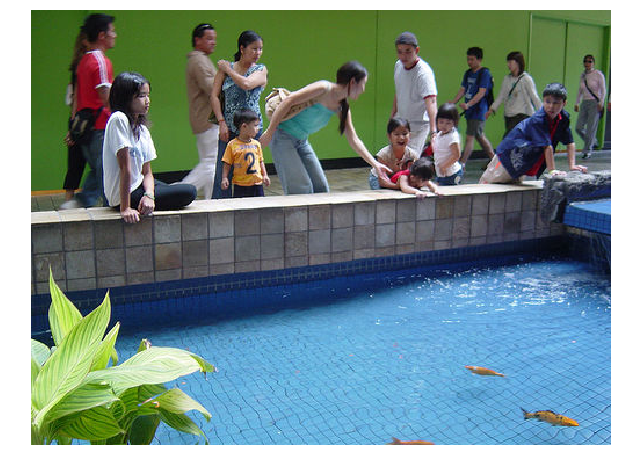

In [54]:
im_id = '12830823_87d2654e31.jpg'
sample_and_plot(im_id)